In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot

In [4]:
from warnings import filterwarnings
filterwarnings('ignore')

In [5]:
data=pd.read_csv('C:/Users/gouth/Downloads/zomato.csv/zomato.csv')
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [58]:
data.isnull().any()

url                            False
address                        False
name                           False
online_order                   False
book_table                     False
rate                            True
votes                          False
phone                           True
location                        True
rest_type                       True
dish_liked                      True
cuisines                        True
approx_cost(for two people)     True
reviews_list                   False
menu_item                      False
listed_in(type)                False
listed_in(city)                False
dtype: bool

In [59]:
data.describe()

,votes
count,51717.000000
mean,283.697527
std,803.838853
min,0.000000
25%,7.000000
50%,41.000000
75%,198.000000
max,16832.000000


In [60]:
data.isna().any()

url                            False
address                        False
name                           False
online_order                   False
book_table                     False
rate                            True
votes                          False
phone                           True
location                        True
rest_type                       True
dish_liked                      True
cuisines                        True
approx_cost(for two people)     True
reviews_list                   False
menu_item                      False
listed_in(type)                False
listed_in(city)                False
dtype: bool

# Data cleaning

In [61]:
#remove Nan values

In [62]:
cols=[]                          #find Nan value columns
for feature in data.columns:
    if(data[feature].isnull().sum()>0):
        cols.append(feature)
cols


['rate',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)']

In [63]:
#find percentage of missing values
for feature in cols:
    print('{} has {} percentage of Nan values'.format(feature,np.round(data[feature].isnull().sum()/len(data)*100,2)))

rate has 15.03 percentage of Nan values
phone has 2.34 percentage of Nan values
location has 0.04 percentage of Nan values
rest_type has 0.44 percentage of Nan values
dish_liked has 54.29 percentage of Nan values
cuisines has 0.09 percentage of Nan values
approx_cost(for two people) has 0.67 percentage of Nan values


In [64]:
data.drop(['url','phone','dish_liked'],axis=1,inplace=True)

In [65]:
#firstly we can fix null values of rate
data['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [66]:
data.dropna(subset=['rate'],inplace=True) #remove Nan values from rate solumn

In [67]:
#data['rate']=data['rate'].str.split('/')
#data['rate']

In [68]:
def split(x):
    return x.split('/')[0]

In [69]:
data['rate']=data['rate'].apply(split)     #split our rate values
data['rate'].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', 'NEW', '2.9', '3.5',
       '2.6', '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2',
       '2.3', '3.4 ', '-', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ',
       '3.7 ', '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ',
       '3.2 ', '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '4.6 ', '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ',
       '2.2 ', '2.0 ', '1.8 '], dtype=object)

In [70]:
data['rate'].replace(['NEW','-'],0,inplace=True)   #replace NEW and - values to 0

In [71]:
data['rate']=data['rate'].astype(float)   #convert rate column to float type

In [72]:
a=data['rate'].unique()
print(sorted(a))  #sorted list of unique values in rate column

[0.0, 1.8, 2.0, 2.1, 2.2, 2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3.0, 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.8, 3.9, 4.0, 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8, 4.9]


In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43942 entries, 0 to 51716
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   address                      43942 non-null  object 
 1   name                         43942 non-null  object 
 2   online_order                 43942 non-null  object 
 3   book_table                   43942 non-null  object 
 4   rate                         43942 non-null  float64
 5   votes                        43942 non-null  int64  
 6   location                     43942 non-null  object 
 7   rest_type                    43791 non-null  object 
 8   cuisines                     43931 non-null  object 
 9   approx_cost(for two people)  43690 non-null  object 
 10  reviews_list                 43942 non-null  object 
 11  menu_item                    43942 non-null  object 
 12  listed_in(type)              43942 non-null  object 
 13  listed_in(city) 

In [74]:
#remove null values from rest_type column

In [75]:
data['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Dessert Parlor, Sweet Shop', 'Bakery, Quick Bites',
       'Sweet Shop, Quick Bites', 'Kiosk', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Beverage Shop, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Microbrewery, Casual Dining', 'Lounge',
       'Bar, Casual Dining', 'Food Court', 'Cafe, Bakery', nan, 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Quick Bites, Beverage Shop',
       'Pub, Bar', 'Casual Dining, Pub', 'Lounge, Bar',
       'Dessert Parlor, Quick Bites', 'Food Co

In [76]:
data['rest_type'].isna().sum()  #find nan values in the column

151

In [77]:
data['rest_type']=data['rest_type'].fillna(data['rest_type'].mode()[0]) #fill nan value with max freq value in dataset
data['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Dessert Parlor, Sweet Shop', 'Bakery, Quick Bites',
       'Sweet Shop, Quick Bites', 'Kiosk', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Beverage Shop, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Microbrewery, Casual Dining', 'Lounge',
       'Bar, Casual Dining', 'Food Court', 'Cafe, Bakery', 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Quick Bites, Beverage Shop',
       'Pub, Bar', 'Casual Dining, Pub', 'Lounge, Bar',
       'Dessert Parlor, Quick Bites', 'Food Court, 

In [78]:
data['rest_type'].isna().sum()

0

In [79]:
#fix null values from cuisines colummn

In [80]:
data['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ..., 'Tibetan, Nepalese',
       'North Indian, Street Food, Biryani',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [81]:
data['cuisines'].isna().sum()

11

In [82]:
data.isna().any()

address                        False
name                           False
online_order                   False
book_table                     False
rate                           False
votes                          False
location                       False
rest_type                      False
cuisines                        True
approx_cost(for two people)     True
reviews_list                   False
menu_item                      False
listed_in(type)                False
listed_in(city)                False
dtype: bool

In [83]:
data['approx_cost(for two people)'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '1,700', '1,400', '1,350', nan, '2,200',
       '2,000', '1,800', '1,900', '180', '330', '2,500', '2,100', '3,000',
       '2,800', '3,400', '50', '40', '1,250', '3,500', '4,000', '2,400',
       '2,600', '1,450', '70', '3,200', '560', '240', '360', '6,000',
       '1,050', '2,300', '4,100', '120', '5,000', '3,700', '1,650',
       '2,700', '4,500'], dtype=object)

In [84]:
data['approx_cost(for two people)'].isna().sum()

252

In [85]:
data.dropna(subset=['approx_cost(for two people)'],inplace=True)
data.dropna(subset=['cuisines'],inplace=True)
data.isna().sum()

address                        0
name                           0
online_order                   0
book_table                     0
rate                           0
votes                          0
location                       0
rest_type                      0
cuisines                       0
approx_cost(for two people)    0
reviews_list                   0
menu_item                      0
listed_in(type)                0
listed_in(city)                0
dtype: int64

# visualization

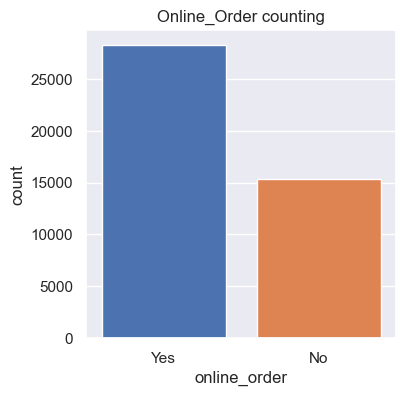

In [86]:
#online order
sns.set_theme(style="darkgrid")
online=data['online_order']
fig,ax=plt.subplots(figsize=(4,4))
sns.countplot(x=online,saturation=1)
plt.title('Online_Order counting')
plt.show()

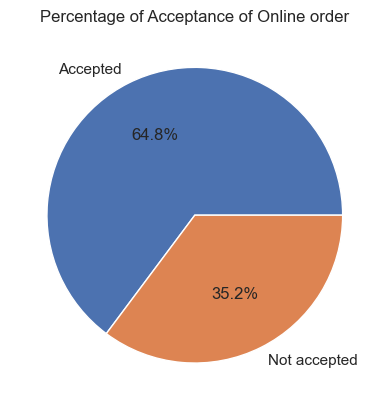

In [87]:
#pie chart
x=data['online_order'].value_counts()
labels=['Accepted','Not accepted']
plt.pie(x,labels=labels,radius=1,autopct='%0.1f%%')
plt.title('Percentage of Acceptance of Online order')
plt.show()

In [88]:
data['online_order'].value_counts()

Yes    28300
No     15382
Name: online_order, dtype: int64

In [89]:
#ratio between restaurants that provide and do not provide table booking
x=data['online_order'].value_counts()
labels=['Accepted','Not accepted']
fig=px.pie(data,values=x,names=labels,title='Percentage of Acceptance of Online order')
fig.show()

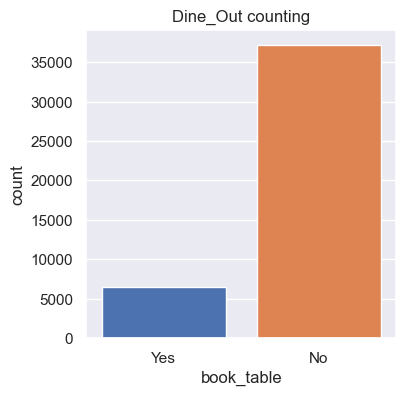

In [90]:
#table booking
fig,ax=plt.subplots(figsize=(4,4))
sns.countplot(x=data['book_table'],saturation=1)
plt.title('Dine_Out counting')
plt.show()

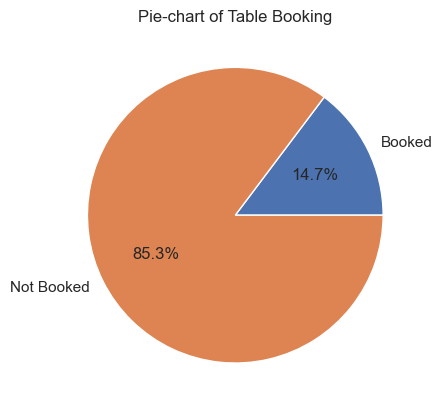

In [91]:
#pie chart
x=data['book_table'].value_counts()[::-1]
labels=['Booked','Not Booked']
plt.pie(x,labels=labels,radius=1,autopct='%0.1f%%')
plt.title('Pie-chart of Table Booking')
plt.show()

In [92]:
#online_order piechart
import plotly.express as px
labels=['Booked','Not Booked']
x=data['book_table'].value_counts()
fig = px.pie(data,values=x,names=labels,title='Ratio of Table booking')
fig.show()

In [93]:
data['book_table'].value_counts()

No     37249
Yes     6433
Name: book_table, dtype: int64

In [94]:
#restaurants name analysis
#how much unique restaurants are there?

In [95]:
print('Number of unique restaurants in bangalore region:',data['name'].nunique())

Number of unique restaurants in bangalore region: 7132


In [96]:
#location analysis

In [97]:
print('number of unique location in dataset:',data['location'].nunique())

number of unique location in dataset: 92


In [98]:
data['location'].value_counts()[0:11]

BTM                      4237
Koramangala 5th Block    2358
HSR                      2113
Indiranagar              1892
JP Nagar                 1849
Jayanagar                1711
Whitefield               1684
Marathahalli             1488
Bannerghatta Road        1318
Koramangala 6th Block    1103
Brigade Road             1084
Name: location, dtype: int64

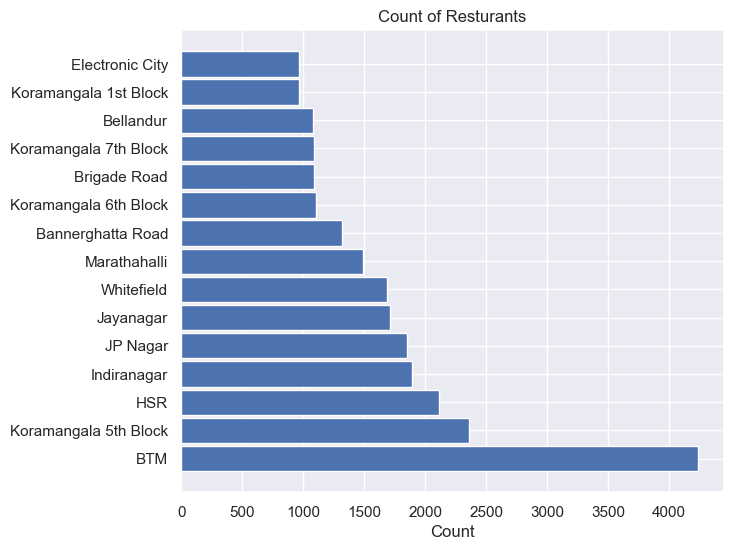

In [99]:
#plot  number of restaurants in banglore based on count first maximum 15 location 
x=dict(data['location'].value_counts()[0:15])
a=list(x.values())
b=list(x.keys())
fig,ax=plt.subplots(figsize=(7,6))
plt.barh(width=a,y=b,height=0.9)
plt.xlabel('Count')
plt.title('Count of Resturants')
plt.show()

In [100]:
'''#which location have the least restaurants
x=dict(data['name'].value_counts()[-10:])
a=list(x.keys())
b=list(x.values())
plt.barh(y=a,width=b)'''

"#which location have the least restaurants\nx=dict(data['name'].value_counts()[-10:])\na=list(x.keys())\nb=list(x.values())\nplt.barh(y=a,width=b)"

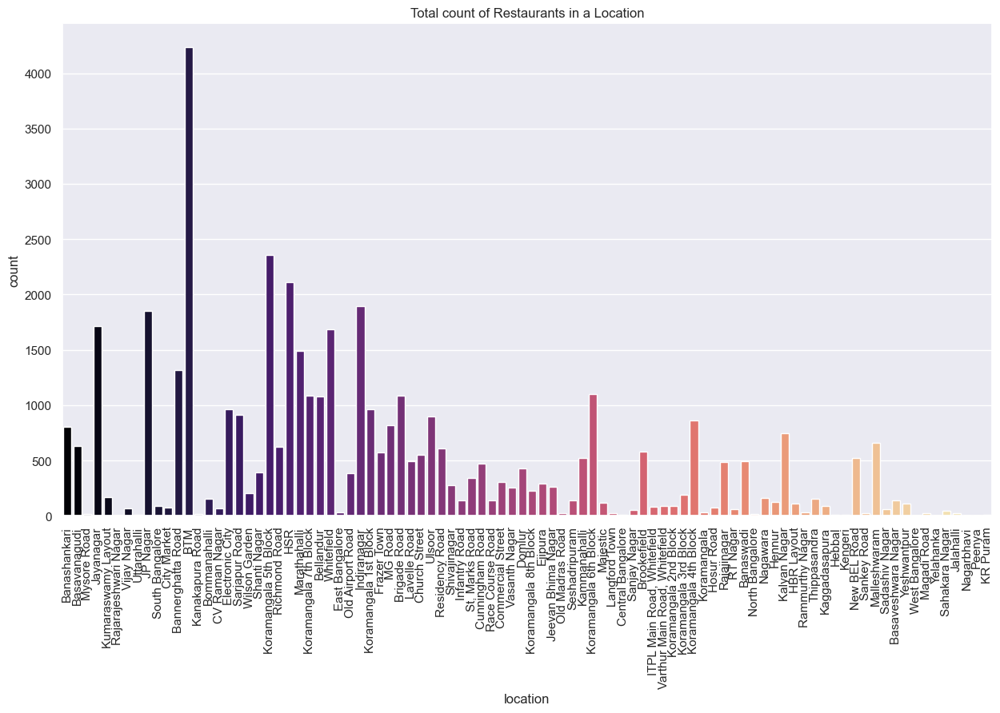

In [101]:
#plot location count
fig,ax=plt.subplots(figsize=(15,8))
sns.countplot(x=data['location'],palette='magma')
plt.xticks(rotation=90)
plt.title('Total count of Restaurants in a Location')
plt.show()

In [6]:
#list of unique restaurants in a location
restaurant=[]
location=[]
for key,location_data in data.groupby('location'):
    location.append(key)
    restaurant.append(len(location_data['name'].unique()))

In [7]:
df_total=pd.DataFrame(zip(location,restaurant)) #creating dataframe
df_total.columns=['location','restaurant']
df_total.set_index('location',inplace=True)
df_total.sort_values(by='restaurant').tail(10)#this shows the whitefield and btm has the maximum number of restaurant

,restaurant
location,
Bellandur,349
Jayanagar,352
Bannerghatta Road,448
JP Nagar,502
Indiranagar,526
Marathahalli,659
HSR,684
Electronic City,696
BTM,699


<AxesSubplot: xlabel='location'>

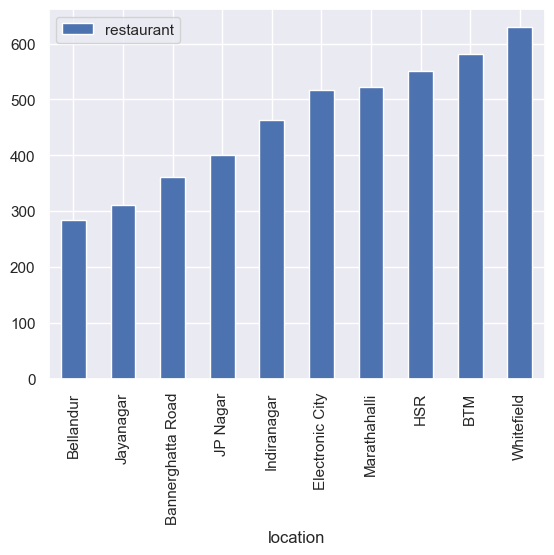

In [104]:
df_total.sort_values(by='restaurant').tail(10).plot.bar()

<AxesSubplot: xlabel='location'>

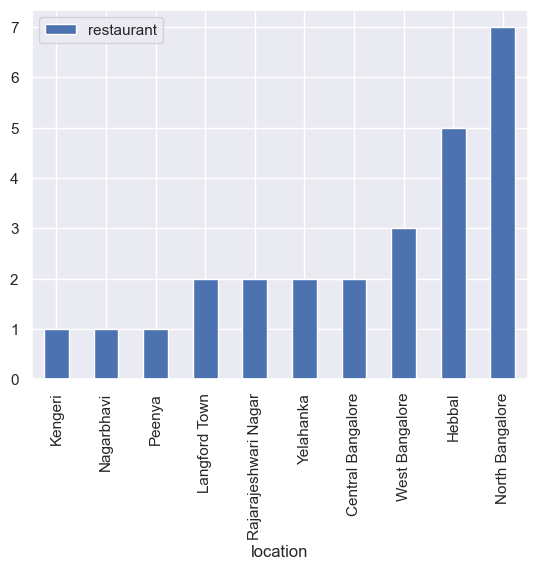

In [105]:
df_total.sort_values(by='restaurant').head(10).plot.bar()

In [8]:
#using plotly
df_total.sort_values(by='restaurant').tail(10).index

Index(['Bellandur', 'Jayanagar', 'Bannerghatta Road', 'JP Nagar',
       'Indiranagar', 'Marathahalli', 'HSR', 'Electronic City', 'BTM',
       'Whitefield'],
      dtype='object', name='location')

In [9]:
trace1=go.Bar(x=df_total['restaurant'].nlargest(10).index,y=df_total['restaurant'].nlargest(10),name='Priority')
iplot([trace1])

In [10]:
#restaurant count based on location using 
restaurant_location=data['location'].value_counts()[:20]
d=go.Bar(x=restaurant_location.index,y=restaurant_location)
iplot([d])

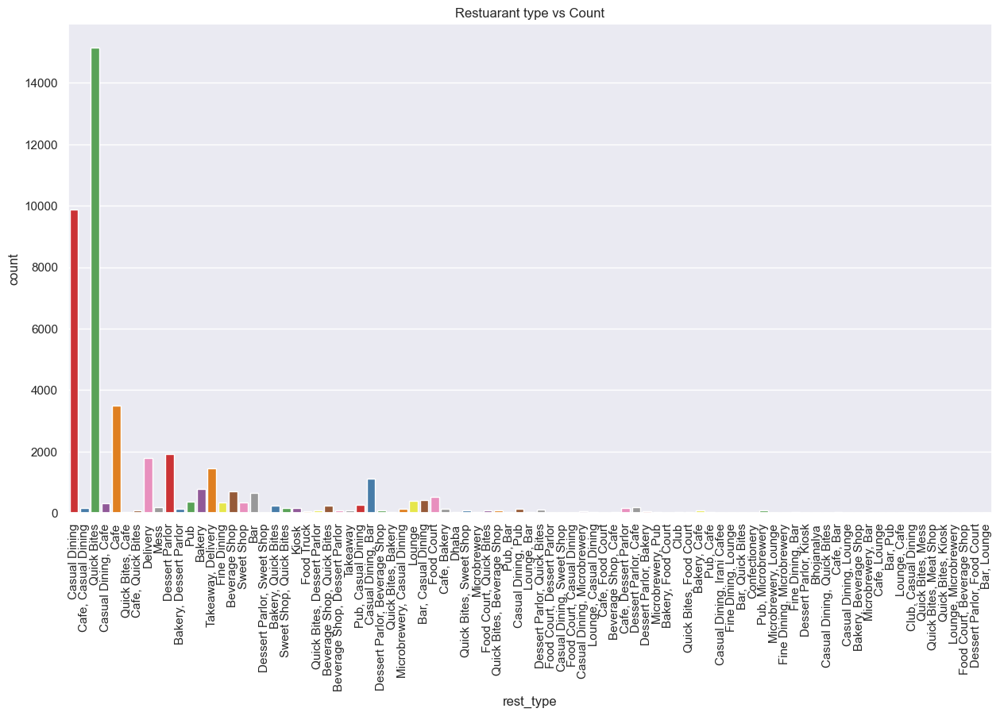

In [109]:
#restuarant type
fig,ax=plt.subplots(figsize=(15,8))
sns.countplot(x=data['rest_type'],palette='Set1')
plt.xticks(rotation=90)
plt.title('Restuarant type vs Count')
plt.show()


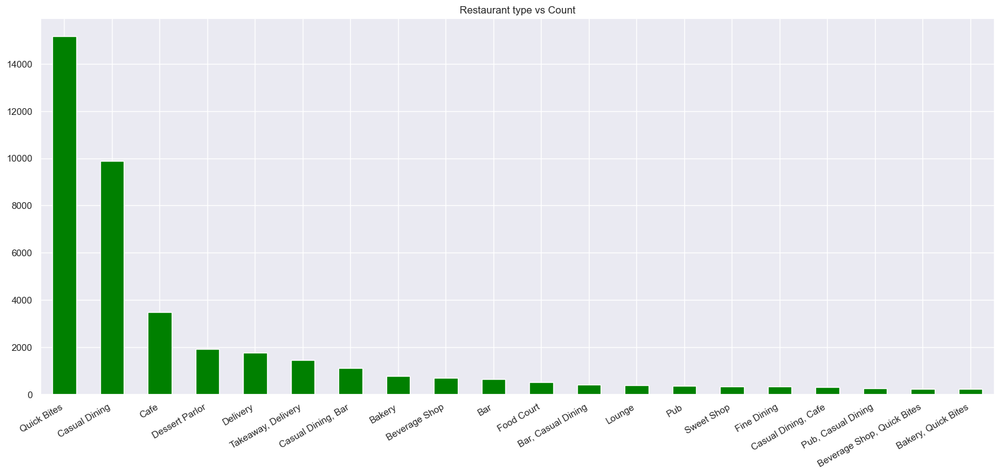

In [110]:
#Restaurant type,largest
plt.figure(figsize=(20,9))
data['rest_type'].value_counts().nlargest(20).plot.bar(color='green')
plt.title('Restaurant type vs Count')
plt.gcf().autofmt_xdate()

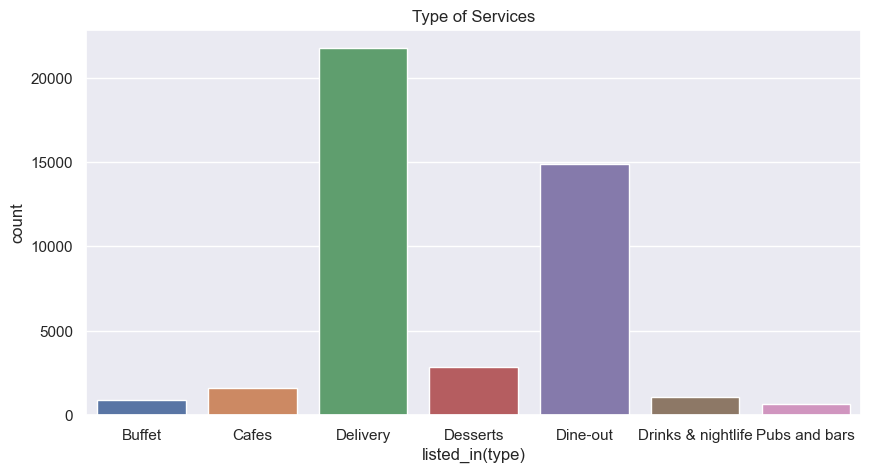

In [111]:
fig,ax=plt.subplots(figsize=(10,5))
sns.countplot(x=data['listed_in(type)'],ax=ax)
plt.title('Type of Services')
plt.show()

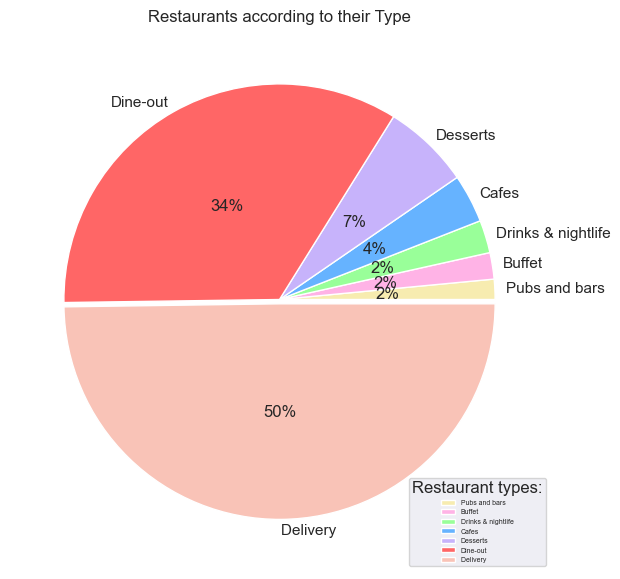

In [112]:
#list_type piechart
rTypeCount=data['listed_in(type)'].value_counts().sort_values(ascending=True)
slices=[rTypeCount[0],
        rTypeCount[1],
        rTypeCount[2],
        rTypeCount[3],
        rTypeCount[4],
        rTypeCount[5],
        rTypeCount[6]]
labels=['Pubs and bars','Buffet','Drinks & nightlife','Cafes','Desserts','Dine-out','Delivery ']
colors = ['#f7ecb0', '#ffb3e6', '#99ff99', '#66b3ff', '#c7b3fb','#ff6666', '#f9c3b7']
plt.pie(slices,colors=colors, labels=labels,explode=(0.0,0.0,0.0,0.0,0.0,0.0,0.02), autopct='%1.0f%%', pctdistance=0.5, labeldistance=1.05)
plt.legend(title='Restaurant types:',loc=4,prop={'size':5})
fig = plt.gcf()
plt.title("Restaurants according to their Type", bbox={'facecolor':'1', 'pad':5})

fig.set_size_inches(10,7)
plt.show()

Text(0.5, 0, 'Number of outlets')

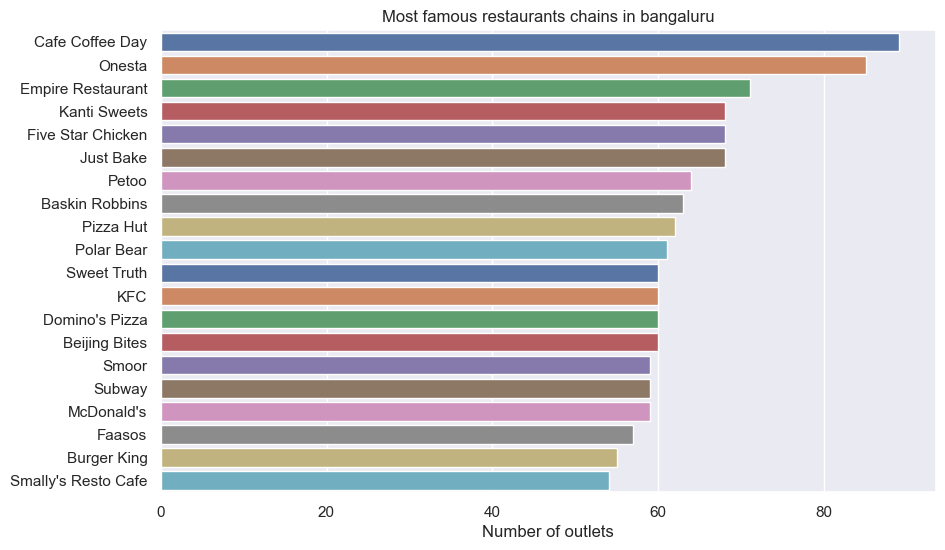

In [113]:
#according to rest_name aju
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
chains=data['name'].value_counts()[0:20]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title('Most famous restaurants chains in bangaluru')
plt.xlabel('Number of outlets')

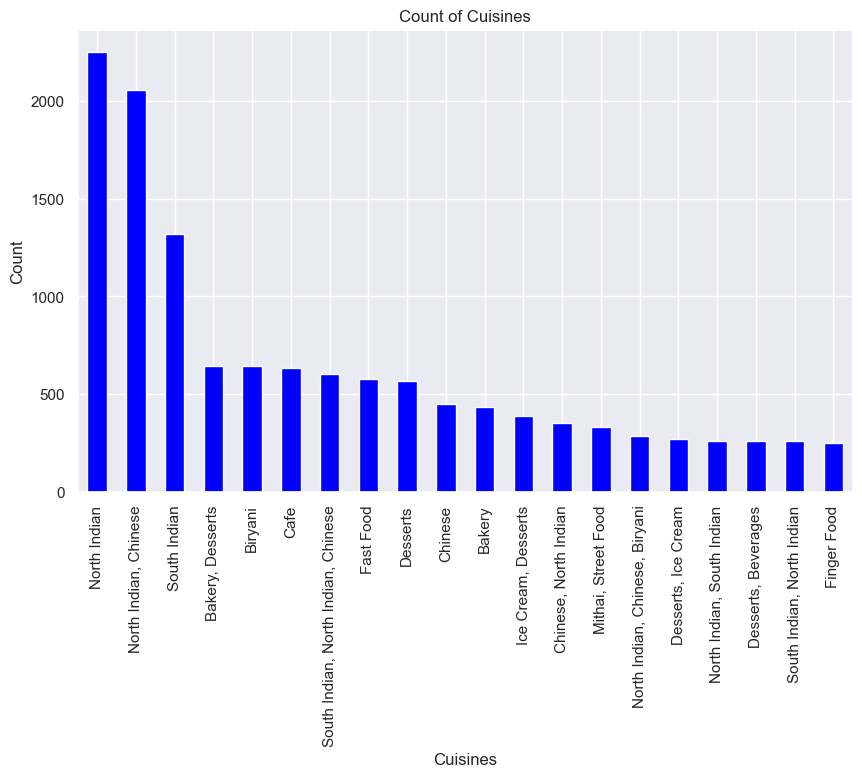

In [114]:
fig,ax=plt.subplots(figsize=(10,6))
data['cuisines'].value_counts()[:20].plot.bar(color='blue')
plt.title('Count of Cuisines')
plt.xlabel('Cuisines')
plt.ylabel('Count')
plt.show()

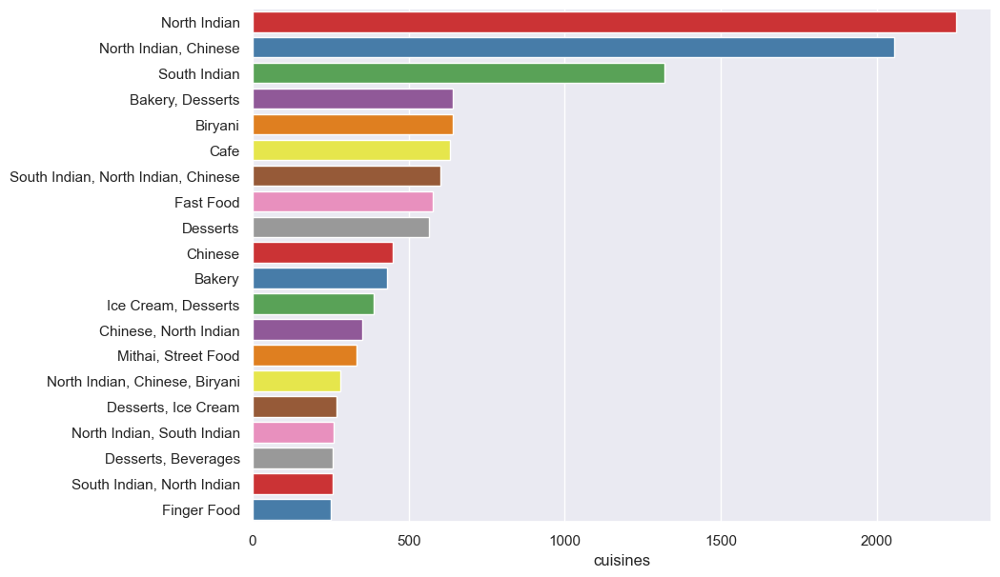

In [115]:
fig,ax=plt.subplots(figsize=(10,7))
sns.barplot(x=data['cuisines'].value_counts()[0:20],y=data['cuisines'].value_counts()[0:20].index,palette='Set1')
plt.show()

In [116]:
#barplot of cuisins using go bar
cuisines=data['cuisines'].value_counts()[:10]
trace1=go.Bar(x=cuisines.index,y=cuisines)
iplot([trace1])

In [117]:
#creating new table for rate analysis
df_rate = data.groupby('name')['rate'].mean().to_frame()
df_rate = df_rate.reset_index()
df_rate.columns=['Restaurant','Rating']
df_rate

,Restaurant,Rating
0,#FeelTheROLL,3.400000
1,#L-81 Cafe,3.900000
2,#refuel,3.700000
3,1000 B.C,3.200000
4,100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,3.700000
...,...,...
7127,i-Bar - The Park Bangalore,3.800000
7128,iFruit Live Ice Creams,3.400000
7129,iSpice Resto Cafe,3.700000
7130,nu.tree,4.314286


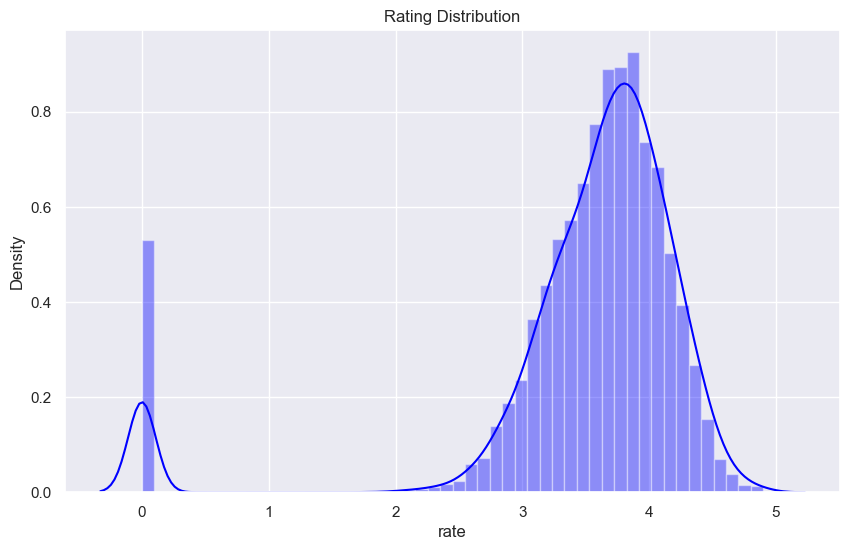

In [118]:
#rating distribution
fig,ax=plt.subplots(figsize=(10,6))
sns.distplot(data['rate'],bins=50,color='blue')
plt.title('Rating Distribution')
plt.show()

In [119]:
data['rate'].max()   #maximum rating out of 5

4.9

In [120]:
data['rate'].min()   #minimum rating out of 5

0.0

In [121]:
(data['rate']>=4).sum() #count of rating more than and equal to 4 

12307

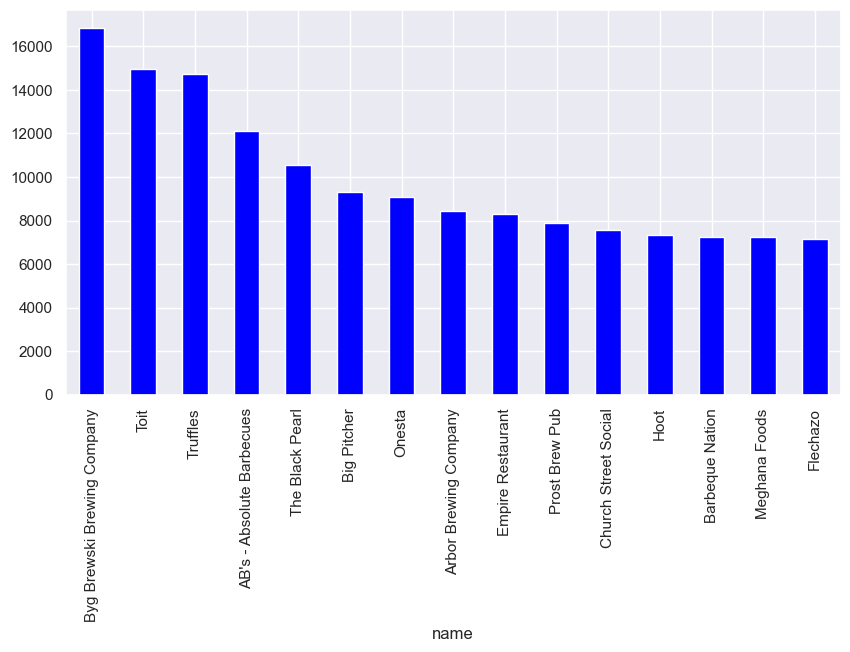

In [122]:
#analysis using voting
fig,ax=plt.subplots(figsize=(10,5))
data.groupby('name')['votes'].max().nlargest(15).plot.bar(color='blue')
plt.show()

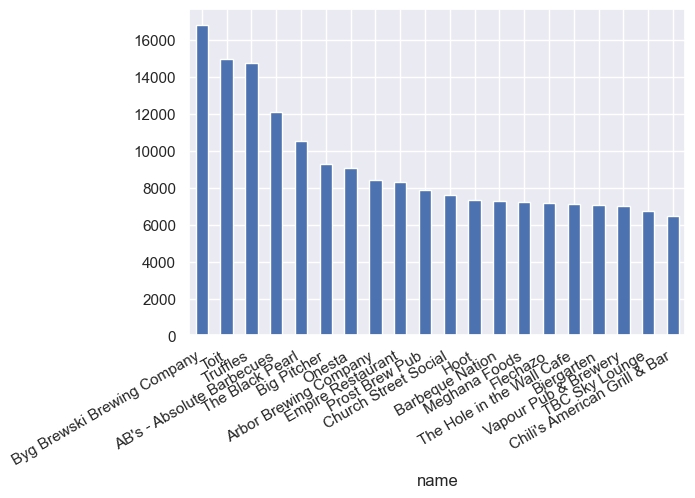

In [123]:
#name and vote
data.groupby('name')['votes'].max().nlargest(20).plot.bar() #highest voted restaurant
plt.gcf().autofmt_xdate()

In [124]:
trace1 = go.Bar(
                x=data.groupby('name')['votes'].max().nlargest(10).index,
                y=data.groupby('name')['votes'].max().nlargest(10),
                name='name')
iplot([trace1])

In [125]:
data['approx_cost(for two people)']=data['approx_cost(for two people)'].astype(str)
data['approx_cost(for two people)']=data['approx_cost(for two people)'].apply(lambda y: y.replace(',',''))
data['approx_cost(for two people)']=data['approx_cost(for two people)'].apply(lambda y: float(y))

<AxesSubplot: xlabel='name'>

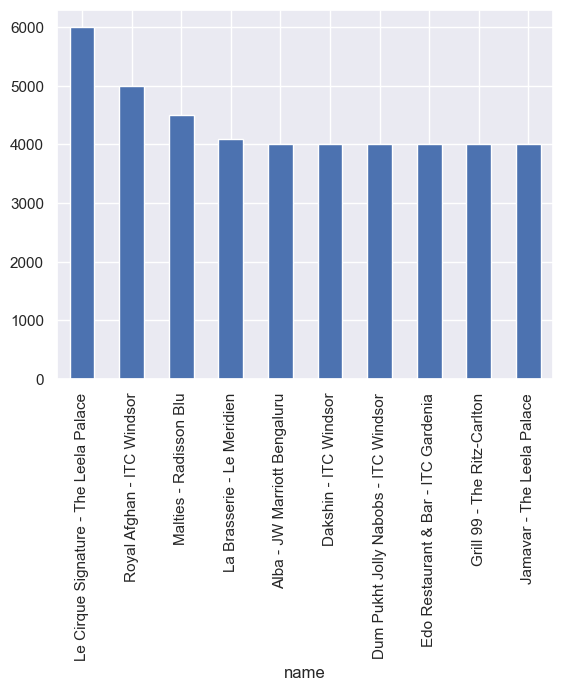

In [126]:
#cost and name(expensive restaurants)
data.groupby('name')['approx_cost(for two people)'].mean().nlargest(10).plot.bar()

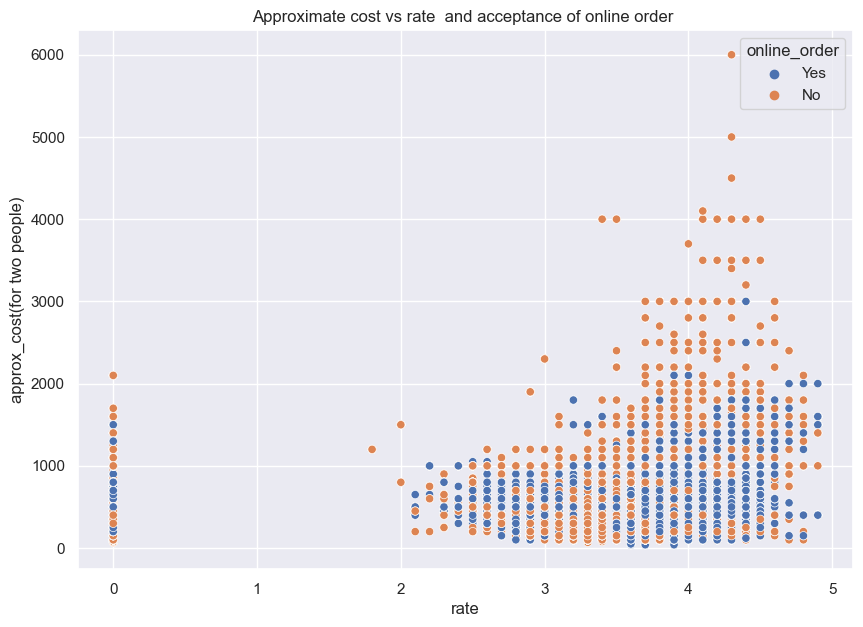

In [130]:
#scatterplot of online order with respect to cost and rate
plt.figure(figsize=(10,7))
sns.scatterplot(x='rate',y='approx_cost(for two people)',hue='online_order',data=data)
plt.title('Approximate cost vs rate  and acceptance of online order ')
plt.show()

<AxesSubplot: xlabel='online_order', ylabel='votes'>

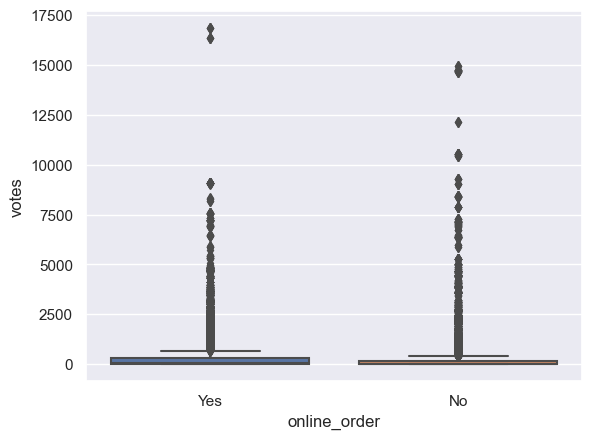

In [76]:
#boxplot for votes and online order
sns.boxplot(x='online_order',y='votes',data=data)

<AxesSubplot: xlabel='online_order', ylabel='approx_cost(for two people)'>

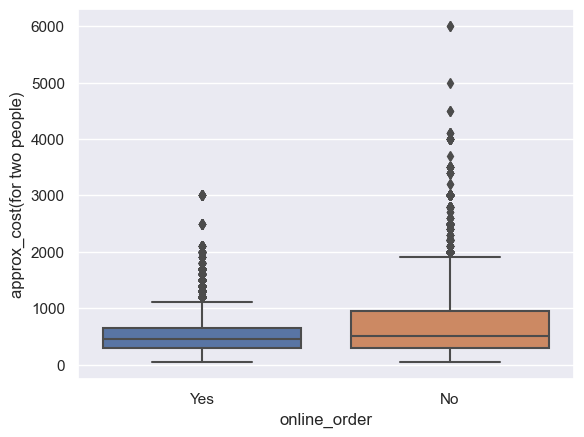

In [77]:
#boxplot for cost and online order
sns.boxplot(x='online_order',y='approx_cost(for two people)',data=data)

In [78]:
# plotly boxplot for cost and online order
fig=px.box(data,x='online_order',y='approx_cost(for two people)')
fig.show()

In [1]:
#distribution of cost for two people
px.histogram(data,x='approx_cost(for two people)',title='Histogram for approximate cost')


NameError: name 'px' is not defined

In [80]:
#cheapest restaurants using barplot
cost=data['approx_cost(for two people)'].nsmallest(10)
fig=go.Bar(x=cost.index,y=cost)
iplot([fig])

In [81]:
df_budget=data[data['approx_cost(for two people)']<=500].loc[:,('approx_cost(for two people)')]
df_budget=df_budget.reset_index()
df_budget.head(10)

,index,approx_cost(for two people)
0,3,300.0
1,10,500.0
2,12,500.0
3,13,450.0
4,18,300.0
5,19,400.0
6,20,400.0
7,21,500.0
8,24,300.0
9,26,200.0


<AxesSubplot: >

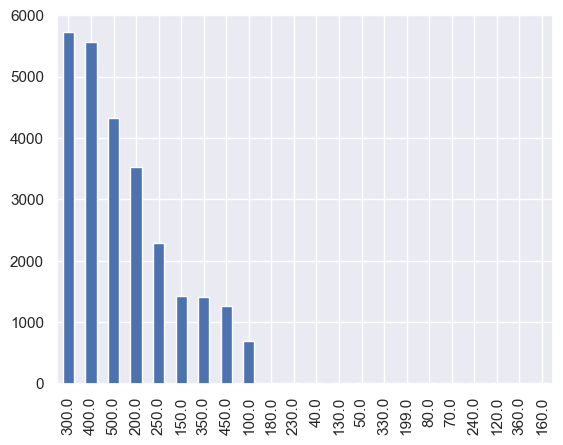

In [82]:
#cost count in budget restaurants
df_budget['approx_cost(for two people)'].value_counts().plot.bar()

Total such various affordable hotels at different location

In [83]:
df_new=data[(data['rate']>=4) & (data['approx_cost(for two people)']<=500)]
len(df_new['name'].unique())

628

In [84]:
location=[]
total=[]
for loc,loc_df in df_new.groupby('location'):
    location.append(loc)
    total.append(len(loc_df['name'].unique()))

In [85]:
location_df=pd.DataFrame(zip(location,total))
location_df.columns=['location','total']
location_df.set_index('location', inplace=True)
location_df.head(10)

,total
location,
BTM,54
Banashankari,25
Banaswadi,3
Bannerghatta Road,19
Basavanagudi,31
Basaveshwara Nagar,3
Bellandur,20
Brigade Road,11
Brookefield,16


In [86]:
c=location_df['total'].nlargest(10)
p=go.Bar(x=c.index,y=c)
iplot([p])

In [87]:
data

,address,name,online_order,book_table,rate,votes,location,rest_type,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,Banashankari,Quick Bites,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,Basavanagudi,Casual Dining,"North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51709,"136, SAP Labs India, KIADB Export Promotion In...",The Farm House Bar n Grill,No,No,3.7,34,Whitefield,"Casual Dining, Bar","North Indian, Continental",800.0,"[('Rated 4.0', 'RATED\n Ambience- Big and spa...",[],Pubs and bars,Whitefield
51711,"139/C1, Next To GR Tech Park, Pattandur Agraha...",Bhagini,No,No,2.5,81,Whitefield,"Casual Dining, Bar","Andhra, South Indian, Chinese, North Indian",800.0,"[('Rated 4.0', 'RATED\n A fine place to chill...",[],Pubs and bars,Whitefield
51712,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,Whitefield,Bar,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51715,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


# implementing location in our Dataset

In [6]:
#pip install geopy

In [7]:
len(data['location'].unique())

94

In [8]:
locations=pd.DataFrame({'name':data['location'].unique()})

In [9]:
locations['new_name']='Bangalore'+locations['name']

In [10]:
locations.head()

,name,new_name
0,Banashankari,BangaloreBanashankari
1,Basavanagudi,BangaloreBasavanagudi
2,Mysore Road,BangaloreMysore Road
3,Jayanagar,BangaloreJayanagar
4,Kumaraswamy Layout,BangaloreKumaraswamy Layout


In [11]:
from geopy.geocoders import Nominatim

In [12]:
lat_lon=[] #list which store latitude and longitude
geolocator=Nominatim(user_agent='app')
for location in locations['name']:
    location=geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)

In [13]:
locations['geo_loc']=lat_lon

In [14]:
locations.head()

,name,new_name,geo_loc
0,Banashankari,BangaloreBanashankari,"(15.8876779, 75.7046777)"
1,Basavanagudi,BangaloreBasavanagudi,"(12.9417261, 77.5755021)"
2,Mysore Road,BangaloreMysore Road,"(12.9467026, 77.5300705)"
3,Jayanagar,BangaloreJayanagar,"(27.64392675, 83.05280519687284)"
4,Kumaraswamy Layout,BangaloreKumaraswamy Layout,"(12.9081487, 77.5553179)"


In [15]:
locations.to_csv('zomato_locations.csv',index=False)

In [16]:
rest_location=pd.DataFrame(data['location'].value_counts().reset_index())

In [17]:
rest_location.columns=['name','count']
rest_location.head()

,name,count
0,BTM,5124
1,HSR,2523
2,Koramangala 5th Block,2504
3,JP Nagar,2235
4,Whitefield,2144


In [18]:
#merge both the dataframes
restaurant_locations=rest_location.merge(locations,on='name',how='left').dropna()
restaurant_locations.head()

,name,count,new_name,geo_loc
0,BTM,5124,BangaloreBTM,"(45.95485055, -112.49659530324134)"
1,HSR,2523,BangaloreHSR,"(18.1475, 41.538889)"
2,Koramangala 5th Block,2504,BangaloreKoramangala 5th Block,"(12.9348429, 77.6189768)"
3,JP Nagar,2235,BangaloreJP Nagar,"(12.2655944, 76.6465404)"
4,Whitefield,2144,BangaloreWhitefield,"(53.5533682, -2.2969019)"


In [19]:
restaurant_locations.shape

(92, 4)

In [20]:
def generateBaseMap(defualt_location=[12.97,77.59],default_zoom_start=12):
    basemap=folium.Map(location=defualt_location,zoom_start=default_zoom_start)
    return basemap

In [21]:
np.array(restaurant_locations['geo_loc'])

array([(45.95485055, -112.49659530324134), (18.1475, 41.538889),
       (12.9348429, 77.6189768), (12.2655944, 76.6465404),
       (53.5533682, -2.2969019), (12.9732913, 77.6404672),
       (27.64392675, 83.05280519687284), (12.9552572, 77.6984163),
       (12.9521804, 77.6041899), (12.93103185, 77.6782471),
       (12.848759900000001, 77.64825295827616), (12.9277245, 77.6327822),
       (-34.0881284, 18.4585622), (12.9364846, 77.6134783),
       (12.9390255, 77.6238477), (12.920441, 77.6653284),
       (12.9778793, 77.6246697), (12.9327778, 77.6294052),
       (12.9755264, 77.6067902), (15.8876779, 75.7046777),
       (13.0221416, 77.6403368), (40.5759389, -74.1254948),
       (12.996845, 77.6130165), (13.0027353, 77.5703253),
       (12.9417261, 77.5755021), (32.729455, 74.8708533),
       (13.0141618, 77.6518539), (33.5935063, -79.0345627),
       (13.0384423, 77.5647533), (13.0093455, 77.6377094),
       (12.9882338, 77.554883), (40.7131693, -74.0092922),
       (40.7652844, -76.37

In [22]:
#unzip it
lat,lon=zip(*np.array(restaurant_locations['geo_loc']))

In [23]:
type(lat)

tuple

In [24]:
restaurant_locations['lat']=lat
restaurant_locations['lon']=lon

In [25]:
restaurant_locations.head()

,name,count,new_name,geo_loc,lat,lon
0,BTM,5124,BangaloreBTM,"(45.95485055, -112.49659530324134)",45.954851,-112.496595
1,HSR,2523,BangaloreHSR,"(18.1475, 41.538889)",18.147500,41.538889
2,Koramangala 5th Block,2504,BangaloreKoramangala 5th Block,"(12.9348429, 77.6189768)",12.934843,77.618977
3,JP Nagar,2235,BangaloreJP Nagar,"(12.2655944, 76.6465404)",12.265594,76.646540
4,Whitefield,2144,BangaloreWhitefield,"(53.5533682, -2.2969019)",53.553368,-2.296902


In [26]:
#!pip install folium

In [27]:
import folium
from folium.plugins import HeatMap
basemap=generateBaseMap()

In [28]:
basemap

In [29]:
restaurant_locations[['lat','lon','count']].values.tolist()

[[45.95485055, -112.49659530324134, 5124.0],
 [18.1475, 41.538889, 2523.0],
 [12.9348429, 77.6189768, 2504.0],
 [12.2655944, 76.6465404, 2235.0],
 [53.5533682, -2.2969019, 2144.0],
 [12.9732913, 77.6404672, 2083.0],
 [27.64392675, 83.05280519687284, 1926.0],
 [12.9552572, 77.6984163, 1846.0],
 [12.9521804, 77.6041899, 1630.0],
 [12.93103185, 77.6782471, 1286.0],
 [12.848759900000001, 77.64825295827616, 1258.0],
 [12.9277245, 77.6327822, 1238.0],
 [-34.0881284, 18.4585622, 1218.0],
 [12.9364846, 77.6134783, 1181.0],
 [12.9390255, 77.6238477, 1156.0],
 [12.920441, 77.6653284, 1065.0],
 [12.9778793, 77.6246697, 1023.0],
 [12.9327778, 77.6294052, 1017.0],
 [12.9755264, 77.6067902, 918.0],
 [15.8876779, 75.7046777, 906.0],
 [13.0221416, 77.6403368, 853.0],
 [40.5759389, -74.1254948, 812.0],
 [12.996845, 77.6130165, 727.0],
 [13.0027353, 77.5703253, 725.0],
 [12.9417261, 77.5755021, 684.0],
 [32.729455, 74.8708533, 675.0],
 [13.0141618, 77.6518539, 664.0],
 [33.5935063, -79.0345627, 658.0],


In [30]:
HeatMap(restaurant_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [31]:
basemap

In [32]:
#north indian
data=pd.read_csv('C:/Users/gouth/Downloads/zomato.csv/zomato.csv')
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [33]:
data1=data[data['cuisines']=='North Indian']
data1.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
5,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8/5,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet,Banashankari
50,https://www.zomato.com/bangalore/petoo-banasha...,"276, Ground Floor, 100 Feet Outer Ring Road, B...",Petoo,No,No,3.7/5,21,+91 8026893211,Banashankari,Quick Bites,NaN,North Indian,450,"[('Rated 2.0', 'RATED\n This is a neatly made...",[],Delivery,Banashankari
72,https://www.zomato.com/bangalore/spicy-tandoor...,"Opposite ICICi Bank, Hanuman Nagar, Banashanka...",Spicy Tandoor,No,No,NEW,0,+91 8050884222,Banashankari,Quick Bites,NaN,North Indian,150,"[('Rated 4.0', 'RATED\n cost for chicken roll...",[],Delivery,Banashankari
87,https://www.zomato.com/bangalore/krishna-sagar...,"38, 22nd Main, 22nd Cross, Opposite BDA, 2nd S...",Krishna Sagar,No,No,3.5/5,31,+91 8892752997\r\n+91 7204780429,Banashankari,Quick Bites,NaN,North Indian,200,"[('Rated 1.0', 'RATED\n Worst experience with...",[],Delivery,Banashankari
94,https://www.zomato.com/bangalore/nandhini-delu...,"304, Opposite Apollo Public School, 100 Feet R...",Nandhini Deluxe,No,No,2.6/5,283,080 26890011\r\n080 26890033,Banashankari,Casual Dining,"Biryani, Chicken Guntur, Thali, Buttermilk, Ma...",North Indian,600,"[('Rated 3.0', 'RATED\n Ididnt like much.\n\n...",[],Delivery,Banashankari


In [34]:
data1.shape

(2913, 17)

In [35]:
north_india=data1.groupby(['location'],as_index=False)['url'].agg('count')
north_india.columns=['name','count']
north_india.head()

,name,count
0,BTM,340
1,Banashankari,36
2,Banaswadi,12
3,Bannerghatta Road,75
4,Basavanagudi,21


In [36]:
north_india=north_india.merge(locations,on='name',how='left').dropna()

In [37]:
north_india.head()

,name,count,new_name,geo_loc
0,BTM,340,BangaloreBTM,"(45.95485055, -112.49659530324134)"
1,Banashankari,36,BangaloreBanashankari,"(15.8876779, 75.7046777)"
2,Banaswadi,12,BangaloreBanaswadi,"(13.0141618, 77.6518539)"
3,Bannerghatta Road,75,BangaloreBannerghatta Road,"(12.9521804, 77.6041899)"
4,Basavanagudi,21,BangaloreBasavanagudi,"(12.9417261, 77.5755021)"


In [38]:
north_india['lan'],north_india['lon']=zip(*north_india['geo_loc'].values)

In [39]:
north_india.drop(['geo_loc'],axis=1)

,name,count,new_name,lan,lon
0,BTM,340,BangaloreBTM,45.954851,-112.496595
1,Banashankari,36,BangaloreBanashankari,15.887678,75.704678
2,Banaswadi,12,BangaloreBanaswadi,13.014162,77.651854
3,Bannerghatta Road,75,BangaloreBannerghatta Road,12.952180,77.604190
4,Basavanagudi,21,BangaloreBasavanagudi,12.941726,77.575502
...,...,...,...,...,...
63,"Varthur Main Road, Whitefield",7,"BangaloreVarthur Main Road, Whitefield",12.941324,77.747110
64,Vasanth Nagar,22,BangaloreVasanth Nagar,12.988721,77.585169
65,Whitefield,188,BangaloreWhitefield,53.553368,-2.296902
66,Wilson Garden,47,BangaloreWilson Garden,12.948934,77.596827


In [48]:
basemap=generateBaseMap()
HeatMap(north_india[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [49]:
basemap

In [41]:
#south indian
data=pd.read_csv('C:/Users/gouth/Downloads/zomato.csv/zomato.csv')
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [42]:
data2=data[data['cuisines']=='South Indian']
data2.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
39,https://www.zomato.com/bangalore/maruthi-davan...,"556/A, Water Tank Road, 3rd Stage, Banashankar...",Maruthi Davangere Benne Dosa,Yes,No,4.0/5,17,+91 9019563485,Banashankari,Quick Bites,NaN,South Indian,150,"[('Rated 5.0', ""RATED\n This restaurant serve...","['Benne Dosa', 'Benne Masala Dosa', 'Benne Kal...",Delivery,Banashankari
41,https://www.zomato.com/bangalore/havyaka-mess-...,"Opp Vinayaka hospital, Near Seetha Circle , 80...",Havyaka Mess,No,No,3.9/5,28,+91 9243195843\r\n+91 9243404670,Banashankari,Mess,NaN,South Indian,300,"[('Rated 4.0', 'RATED\n Food is good.very hom...",[],Delivery,Banashankari
66,https://www.zomato.com/bangalore/namma-brahmin...,"30th Cross, 8th Main, Near Jain Temple, 4th Bl...",Namma Brahmin's Idli,Yes,No,3.6/5,34,+91 8310555879,Jayanagar,Quick Bites,NaN,South Indian,100,"[('Rated 4.0', 'RATED\n Quite a cosy & small ...","['Tatte Idli', 'Butter Idli', 'Butter Pudi Idl...",Delivery,Banashankari
76,https://www.zomato.com/bangalore/sri-guru-kott...,"49/1, Subbaraoshetty Road, Netkallappa Circle,...",Sri Guru Kottureshwara Davangere Benne Dosa,Yes,No,4.1/5,558,+91 9448305384\r\n+91 9060079480,Basavanagudi,Quick Bites,"Benne Dosa, Mirchi Bajji, Filter Coffee, Poha,...",South Indian,150,"[('Rated 4.0', 'RATED\n My go-to benne dosa p...","['Benne Dose', 'Benne Kali Dose', 'Open Dose',...",Delivery,Banashankari
91,https://www.zomato.com/bangalore/sunsadm-banas...,"Shop 18 , 3rd cross road,Markandeya Layout, Ba...",Sunsadm,No,No,NaN,0,+91 7829290358,Banashankari,"Takeaway, Delivery",NaN,South Indian,400,[],[],Delivery,Banashankari


In [43]:
south_india=data2.groupby(['location'],as_index=False)['url'].agg('count')
south_india.columns=['name','count']
south_india.head()

,name,count
0,BTM,113
1,Banashankari,86
2,Banaswadi,37
3,Bannerghatta Road,48
4,Basavanagudi,89


In [44]:
south_india=south_india.merge(locations,on='name',how='left').dropna()
south_india.head()

,name,count,new_name,geo_loc
0,BTM,113,BangaloreBTM,"(45.95485055, -112.49659530324134)"
1,Banashankari,86,BangaloreBanashankari,"(15.8876779, 75.7046777)"
2,Banaswadi,37,BangaloreBanaswadi,"(13.0141618, 77.6518539)"
3,Bannerghatta Road,48,BangaloreBannerghatta Road,"(12.9521804, 77.6041899)"
4,Basavanagudi,89,BangaloreBasavanagudi,"(12.9417261, 77.5755021)"


In [45]:
south_india['lan'],south_india['lon']=zip(*south_india['geo_loc'].values)

In [46]:
south_india.drop(['geo_loc'],axis=1)

,name,count,new_name,lan,lon
0,BTM,113,BangaloreBTM,45.954851,-112.496595
1,Banashankari,86,BangaloreBanashankari,15.887678,75.704678
2,Banaswadi,37,BangaloreBanaswadi,13.014162,77.651854
3,Bannerghatta Road,48,BangaloreBannerghatta Road,12.952180,77.604190
4,Basavanagudi,89,BangaloreBasavanagudi,12.941726,77.575502
...,...,...,...,...,...
66,Vasanth Nagar,12,BangaloreVasanth Nagar,12.988721,77.585169
67,Vijay Nagar,9,BangaloreVijay Nagar,16.779150,74.698169
68,Whitefield,63,BangaloreWhitefield,53.553368,-2.296902
69,Wilson Garden,15,BangaloreWilson Garden,12.948934,77.596827


In [47]:

basemap=generateBaseMap()
HeatMap(south_india[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap